# David Baranger Method

In [ ]:
path='ddat/crowdAI/'
list.files(path)

In [21]:
setwd(path)

ERROR: Error in setwd(path): cannot change working directory


In [22]:
getwd()

[1] "/home/ahmadA/dereck/ddat/crowdAI"

### 1.Setup data for analysis

The first step is to convert the g-zipped .vcf files provided by crowdAI to the plink binary format.

In [14]:
system(paste ("plink --vcf genotyping_data_fullset_train.vcf --biallelic-only strict --make-bed --out OpenSNP_train",sep=" "))
system(paste ("plink --vcf genotyping_data_fullset_test.vcf --biallelic-only strict --make-bed --out OpenSNP_test",sep=" "))

remove variables named "." and other errors

In [16]:
library(data.table)
Train_bim<-fread(c("OpenSNP_train.bim"))
Train_bim2<-filter(Train_bim, Train_bim$V2 != ".")
Train_bim4<-Train_bim2[!duplicated(Train_bim2[c('V2')]), ]

Read 7252636 rows and 6 (of 6) columns from 0.190 GB file in 00:00:21


Warning message in data.matrix(data):
“NAs introduced by coercion”Warning message in data.matrix(data):
“NAs introduced by coercion”Warning message in data.matrix(data):
“NAs introduced by coercion”

ERROR: Error in filter(Train_bim, V2 != "."): object 'V2' not found


In [25]:
nrow(Train_bim)

[1] 7252636

In [49]:
write.table(x=tmp1,file=c("SNPS_keep.txt"),sep="",quote = F,col.names = F,row.names = F)

In [50]:
system(paste ("plink --bfile OpenSNP_train --extract SNPS_keep.txt --make-bed --out OpenSNP_train2",sep=" "))
system(paste ("plink --bfile OpenSNP_test --extract SNPS_keep.txt --make-bed --out OpenSNP_test2",sep=" "))

merge them and throw-out anything else problematic

In [51]:
system(paste ("plink --bfile OpenSNP_train2 --bmerge OpenSNP_test2 --make-bed --out OpenSNP_combined",sep=" "))
system(paste ("plink --bfile OpenSNP_train2 --exclude OpenSNP_combined-merge.missnp --make-bed --out OpenSNP_train3",sep=" "))
system(paste ("plink --bfile OpenSNP_test2 --exclude OpenSNP_combined-merge.missnp --make-bed --out OpenSNP_test3",sep=" "))
system(paste ("plink --bfile OpenSNP_train3 --bmerge OpenSNP_test3 --make-bed --out OpenSNP_combined2",sep=" "))

In [52]:
Errors<-readLines(c("OpenSNP_combined2.log"))
Rem<-as.data.frame(matrix(NA,length(Errors),1))
for (i in 1: length(Errors)){
  Mult<-regexpr('Warning: Multiple positions seen for variant',Errors[i])
       if(Mult>0){Rem[i,1]<-substr(Errors[i],47,(nchar(Errors[i])-2)) }
  Dup<-regexpr('Warning: Variants ',Errors[i])
       if(Dup>0){
                 And<-regexpr(pattern = 'and',Errors[i])
                 Rem[i,1]<-substr(Errors[i],20,(And[1]-3)) 
                  }
}

Rem<-na.omit(Rem)

In [53]:
Errors

[1] "PLINK v1.90b4 64-bit (20 Mar 2017)"                                         
    [2] "Options in effect:"                                                         
    [3] "  --bfile OpenSNP_train3"                                                   
    [4] "  --bmerge OpenSNP_test3"                                                   
    [5] "  --make-bed"                                                               
    [6] "  --out OpenSNP_combined2"                                                  
    [7] ""                                                                           
    [8] "Hostname: gpu-01"                                                           
    [9] "Working directory: /home/ahmadA/dereck/ddat/crowdAI"                        
   [10] "Start time: Tue Jun  5 10:35:38 2018"                                       
   [11] ""                                                                           
   [12] "Random number seed: 1528166138"                                             
   [13] "128804 MB RAM detected; reserving 64402 MB for main workspace."             
   [14] "Allocated 15282 MB successfully, after larger attempt(s) failed."           
   [15] "784 people loaded from OpenSNP_train3.fam."                                 
   [16] "137 people to be merged from OpenSNP_test3.fam."                            
   [17] "Of these, 137 are new, while 0 are present in the base dataset."            
   [18] "Warning: Multiple positions seen for variant 'rs71272942'."                 
   [19] "Warning: Multiple positions seen for variant 'rs71577259'."                 
   [20] "Warning: Multiple positions seen for variant 'rs71575474'."                 
   [21] "Warning: Multiple positions seen for variant 'rs71592374'."                 
   [22] "Warning: Multiple positions seen for variant 'rs71575201'."                 
   [23] "Warning: Multiple positions seen for variant 'rs71583911'."                 
   [24] "Warning: Multiple positions seen for variant 'rs71585836'."                 
   [25] "Warning: Multiple positions seen for variant 'rs373432227'."                
   [26] "Warning: Multiple positions seen for variant 'rs71412871'."                 
   [27] "Warning: Multiple positions seen for variant 'rs71412779'."                 
   [28] "Warning: Multiple positions seen for variant 'rs71412791'."                 
   [29] "Warning: Multiple positions seen for variant 'rs71409862'."                 
   [30] "Warning: Multiple positions seen for variant 'rs71624375'."                 
   [31] "Warning: Multiple positions seen for variant 'rs34120793'."                 
   [32] "Warning: Multiple positions seen for variant 'rs71622524'."                 
   [33] "Warning: Multiple positions seen for variant 'rs71625207'."                 
   [34] "Warning: Multiple positions seen for variant 'rs71635240'."                 
   [35] "Warning: Multiple positions seen for variant 'rs71600745'."                 
   [36] "Warning: Multiple positions seen for variant 'rs71589695'."                 
   [37] "Warning: Multiple positions seen for variant 'rs71602750'."                 
   [38] "Warning: Multiple positions seen for variant 'rs71591765'."                 
   [39] "Warning: Multiple positions seen for variant 'rs71593780'."                 
   [40] "Warning: Multiple positions seen for variant 'rs71593789'."                 
   [41] "Warning: Multiple positions seen for variant 'rs71588665'."                 
   [42] "Warning: Multiple positions seen for variant 'rs71593822'."                 
   [43] "Warning: Multiple positions seen for variant 'rs71590581'."                 
   [44] "Warning: Multiple positions seen for variant 'rs71582497'."                 
   [45] "Warning: Multiple positions seen for variant 'rs34854796'."                 
   [46] "Warning: Multiple positions seen for variant 'rs71593227'."                 
   [47] "Warning: Multiple positions seen for va

In [57]:
tail(Rem)

,V1
18240,rs763446919
18241,rs757281154
18242,rs760634845
18243,rs762260996
18244,rs72431348
18245,rs201389655


In [58]:
write.table(x=Rem$V1,file=c("SNPS_remove.txt"),sep="",quote = F,col.names = F,row.names = F)
system(paste ("plink --bfile OpenSNP_combined2 --exclude SNPS_remove.txt --make-bed --out OpenSNP_combined3",sep=" "))

### 2.Guess people’s biological sex (it wasn’t provided)

Now that we have everyone in one plink file with no errors, we can guess their biological sex. This is done with the plink -impute-sex flag, which computes X-chromosome inbreeding coefficients. First we need to prune-out correlated snps

In [ ]:
system(paste ("plink --bfile OpenSNP_combined3 --indep-pairphase 20000 2000 0.5 --make-bed --out OpenSNP_combined4",sep=" "))
system(paste ("plink --bfile OpenSNP_combined3 --extract OpenSNP_combined4.prune.in --make-bed --out OpenSNP_combined5",sep=" "))
system(paste ("plink --bfile OpenSNP_combined5 --impute-sex ycount --make-bed --out OpenSNP_combined6",sep=" "))

### Linear Regression of Gender Model


  0   1   2 
  1 524 396 

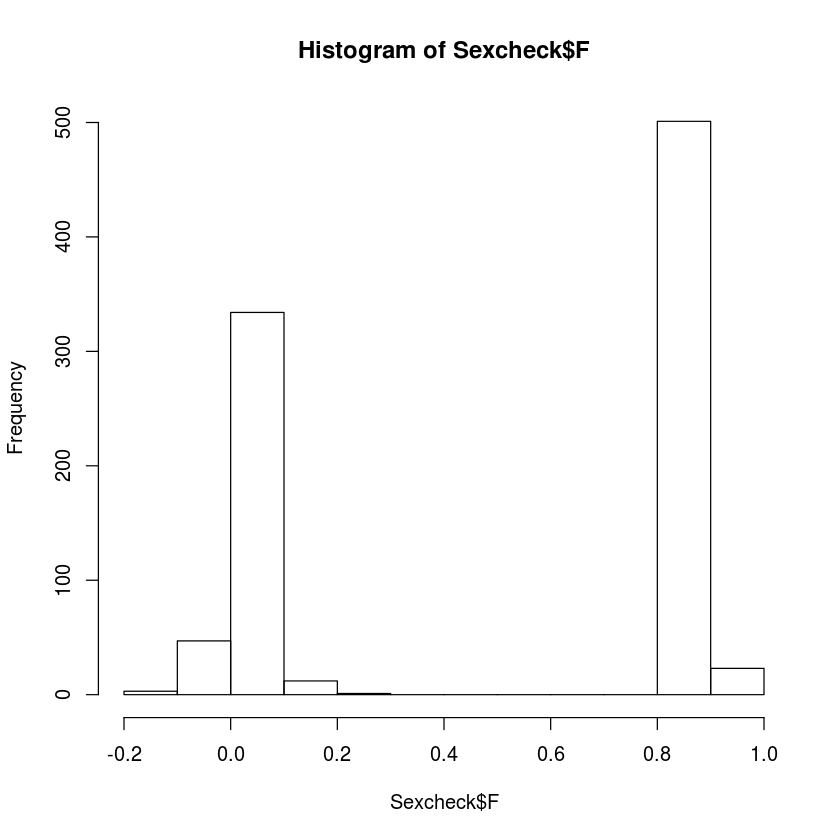

In [23]:
library(data.table)
Sexcheck<-fread("OpenSNP_combined6.sexcheck")
hist(Sexcheck$F)
table(Sexcheck$SNPSEX)

In [19]:
write.csv(Sexcheck,file='opensnp_trianandtest_metadata.csv')

We see a nice separation of F-scores, indicating that it's probably pretty accurate. However, there is one person the algorithm isn't certain about. They're probably biologically female(F=0.2),but I'm going to remove them anyway. Then we can make the first model.

In [24]:
#library(dplyr, quietly = T,warn.conflicts = F,verbose = F)
Height<-read.csv('phenotypes.csv',row.names=1) #This is the training data Heights

In [42]:
Sex2<-merge(Sexcheck,Height, by="IID")

In [17]:
#write.csv(Sex2,file='opensnp_metadat.csv')

In [43]:
Sex2<- Sex2[Sex2$SNPSEX > 0,]

In [45]:
fit1<-lm(Height ~ SNPSEX, data = Sex2)
summary(fit1)


Call:
lm(formula = Height ~ SNPSEX, data = Sex2)

Residuals:
     Min       1Q   Median       3Q      Max 
-26.4189  -5.0115  -0.0315   5.5811  23.7811 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 193.8063     0.8427  229.97   <2e-16 ***
SNPSEX      -14.3874     0.5568  -25.84   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 7.714 on 781 degrees of freedom
Multiple R-squared:  0.4609,	Adjusted R-squared:  0.4602 
F-statistic: 667.8 on 1 and 781 DF,  p-value: < 2.2e-16


Unsurprisingly, biological sex is a good predictor of Height, capturing ~46% of variance (women are shorter than men).

In [58]:
Sex3<-as.data.frame(setdiff(Sexcheck$IID,Sex2$IID))
colnames(Sex3)<-c("IID")
Sex3<-merge(Sex3,Sexcheck, by = "IID")
Sex3<-Sex3[Sex3$SNPSEX > 0,]
Sex3$pred2<-predict(fit1,Sex3)
write.table(Sex3$pred2,file="PredSex2.txt",sep = ",",col.names = F,row.names = F)

Here's how this prediction - that each person's height is the average for their sex, stacks-up. In the independent test set, sex alone predict 42.08% of the variance.

### 3.Remove related people from the training data

The next step will be to identify family members, and remove them. I used plink's - genome flag, which computes an estimate of identity by descent. IBD reflects how related two people are.
1.00 = Same person or monozygotic twins
0.50 = Parent/child or siblings
0.25 = First cousins
etc…
A cutoff of 0.1875 (halfway between 1st and 2nd cousins) is pretty typical.
So I’ll pull out all the IBDs above a low threshold, 0.05, and plot everything above IBD=0.1.

In [59]:
system(paste ("plink --bfile OpenSNP_combined5 --genome --min 0.05 --out OpenSNP_combined5_IBD",sep=" "))

In [102]:
ibd<- fread('OpenSNP_combined5_IBD.genome')

In [104]:
summary(ibd)

      FID1            IID1            FID2            IID2      
 Min.   : 54.0   Min.   : 54.0   Min.   : 61.0   Min.   : 61.0  
 1st Qu.:158.0   1st Qu.:158.0   1st Qu.:461.0   1st Qu.:461.0  
 Median :390.0   Median :390.0   Median :706.0   Median :706.0  
 Mean   :353.4   Mean   :353.4   Mean   :632.8   Mean   :632.8  
 3rd Qu.:529.0   3rd Qu.:529.0   3rd Qu.:766.0   3rd Qu.:766.0  
 Max.   :901.0   Max.   :901.0   Max.   :917.0   Max.   :917.0  
      RT               EZ                Z0               Z1         
 Length:247         Mode:logical   Min.   :0.0015   Min.   :0.00000  
 Class :character   NA's:247       1st Qu.:0.8599   1st Qu.:0.00000  
 Mode  :character                  Median :0.8731   Median :0.00000  
                                   Mean   :0.8742   Mean   :0.03557  
                                   3rd Qu.:0.9412   3rd Qu.:0.00000  
                                   Max.   :0.9496   Max.   :0.84790  
       Z2              PI_HAT             PHE          

In [118]:
ibd[ibd$Z1>0.1875]

FID1,IID1,FID2,IID2,RT,EZ,Z0,Z1,Z2,PI_HAT,PHE,DST,PPC,RATIO
392,392,420,420,UN,NA,0.1846,0.8046,0.0108,0.4131,-1,0.825464,1,9.7424
492,492,871,871,UN,NA,0.1460,0.8465,0.0076,0.4308,-1,0.828752,1,11.1630
511,511,622,622,UN,NA,0.5483,0.4499,0.0018,0.2268,-1,0.788223,1,3.6336
846,846,899,899,UN,NA,0.1375,0.8479,0.0146,0.4386,-1,0.830708,1,11.8635
901,901,917,917,UN,NA,0.5756,0.4113,0.0131,0.2187,-1,0.787305,1,3.7878


We see several pairs of participants that are strongly related, and then one HUGE clump of people who are all related to each other. In reality, these people are all 3rd cousins, but that extended family is waaaayy larger than one would expect by chance. Keep in mind, these are all people who voluntarily uploaded their genotype data to a public website and made it totally open. People do this for many reasons, though one would be if they have a disease of some sort that runs in the family, they may hope to learn more about it.

I removed one member from each pair with an IBD > 0.1875, and all but one of the people in the huge clump.

In [ ]:
Train_Exclude<-c(567, 191, 849, 796, 569, 680, 461, 706, 688, 457, 746, 737, 263, 390, 61, 529, 55, 338, 492, 846, 392, 511, 901, 457)
Train_Exclude<-cbind(Train_Exclude,Train_Exclude)
write.table(x=Train_Exclude, file="TrainExclude.txt", sep=" ", quote = F, row.names = F, col.names = F)

In [67]:
system(paste ("plink --bfile OpenSNP_combined3 --remove TrainExclude.txt --make-bed --out OpenSNP_combined7",sep=" ")) 

### 4.Generate Principal Components

We can use plink to generate the top 20 principal components

In [68]:
system(paste ("plink --bfile OpenSNP_combined7 --pca 20 --out PCs20_SNP7",sep=" "))

We see that the first PC has a very large eigenvalue. This is a hallmark of population stratification.

In [60]:
Sexcheck<-fread("OpenSNP_combined6.sexcheck")
Height<-read.csv('phenotypes.csv',row.names=1)
PCs<- fread("PCs20_SNP7.eigenvec",col.names = c("FID","IID",paste0("PC",1:20)))

In [61]:
Dat<-merge(PCs, Sexcheck, by = "IID")

In [62]:
Test<-fread('OpenSNP_test.fam')
colnames(Test)[1]<-"IID"
Test<-merge(Test,Dat, by="IID")

In [63]:
Train<-merge(Height, Dat, by="IID")

Fit_all<-lm(as.formula(paste("Height ~ SNPSEX + ", paste("PC",c(1:3),sep="",collapse = "+") )),data=Train)
summary(Fit_all)


Call:
lm(formula = as.formula(paste("Height ~ SNPSEX + ", paste("PC", 
    c(1:3), sep = "", collapse = "+"))), data = Train)

Residuals:
     Min       1Q   Median       3Q      Max 
-25.4250  -5.1871  -0.0511   5.2435  22.5740 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 193.9403     0.8468 229.026  < 2e-16 ***
SNPSEX      -14.4559     0.5626 -25.695  < 2e-16 ***
PC1          20.4119     9.0214   2.263  0.02394 *  
PC2         -28.1697     8.3505  -3.373  0.00078 ***
PC3          18.5659     8.1379   2.281  0.02280 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 7.646 on 756 degrees of freedom
Multiple R-squared:  0.4681,	Adjusted R-squared:  0.4653 
F-statistic: 166.3 on 4 and 756 DF,  p-value: < 2.2e-16


The principal components improve our model performance in the training data by ~1%

Similarly, the principal components improve the performance in the testing data by ~1%. Now the model explains 43.28%.

### 5.Create a Polygenic Risk Score (PRS) for Height

Dr. Sarah Medland has an excellent presentation online on how to create polygenic risk scores. I’m not going to go into all the details. I use PRSice to create my PRS. Well actually, I use a custom R-script based on PRSice, because PRSice is linux-only and doesn’t easily produce results at the thresholds I want, but the result is the same. I generated PRS for Height at several different thresholds, I plot the amount of additional variance they explain in the training sample, below.

In [111]:
PRS<-fread("Baranger_Data_crowdAI.txt")

In [116]:
head(PRS[Test==0,])

IID,Test,PC1,PC2,PC3,Sex,PRS
1,0,0.00952677,-0.00939745,0.01801290,1,-0.000607798
2,0,0.01169980,-0.01111930,0.00766312,2,-0.000379817
3,0,-0.05165840,0.17538100,-0.00895318,1,-0.001026150
4,0,0.01194310,-0.01450770,0.03036660,1,-0.000253670
5,0,0.00156812,-0.00726911,-0.04012230,1,-0.000780505
6,0,0.01271470,-0.01291500,0.01060870,1,-0.000644266


In [118]:
Train<-merge(Height,PRS[Test==0,], by="IID")

Fit_all<-lm(as.formula(paste("Height ~ Sex + PRS +", paste("PC",c(1:3),sep="",collapse = "+") )),data=Train)
summary(Fit_all)


Call:
lm(formula = as.formula(paste("Height ~ Sex + PRS +", paste("PC", 
    c(1:3), sep = "", collapse = "+"))), data = Train)

Residuals:
     Min       1Q   Median       3Q      Max 
-23.3646  -4.2482   0.1604   4.7692  19.6512 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)   202.5610     0.9840 205.851  < 2e-16 ***
Sex           -14.3021     0.5033 -28.419  < 2e-16 ***
PRS         17480.1269  1306.6537  13.378  < 2e-16 ***
PC1           -45.1820     9.3370  -4.839 1.58e-06 ***
PC2            13.1521     7.8345   1.679   0.0936 .  
PC3           -12.5530     7.7130  -1.628   0.1040    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.828 on 755 degrees of freedom
Multiple R-squared:  0.5764,	Adjusted R-squared:  0.5735 
F-statistic: 205.4 on 5 and 755 DF,  p-value: < 2.2e-16


We see that the PRS explains an additional 6.9% – 10.0% of the variance, with the threshold p<0.00001 performing best. While this would be amazing performance for almost any other trait (genetics analyses are still only able to predict a small fraction of the variance of a trait, in most cases), this is honestly pretty poor for Height (physical traits are easier to predict than more complex things, like IQ, and Height has been very thoroughly studied). The poor performance is likely due to the multi-ethnic sample.

The PRS explains an additional 10% of variance in the test-data. It’s nice to see that it performs roughly as well in the test as in the training data!

In [66]:
pce<- read.table('PCs20_SNP7.eigenval')

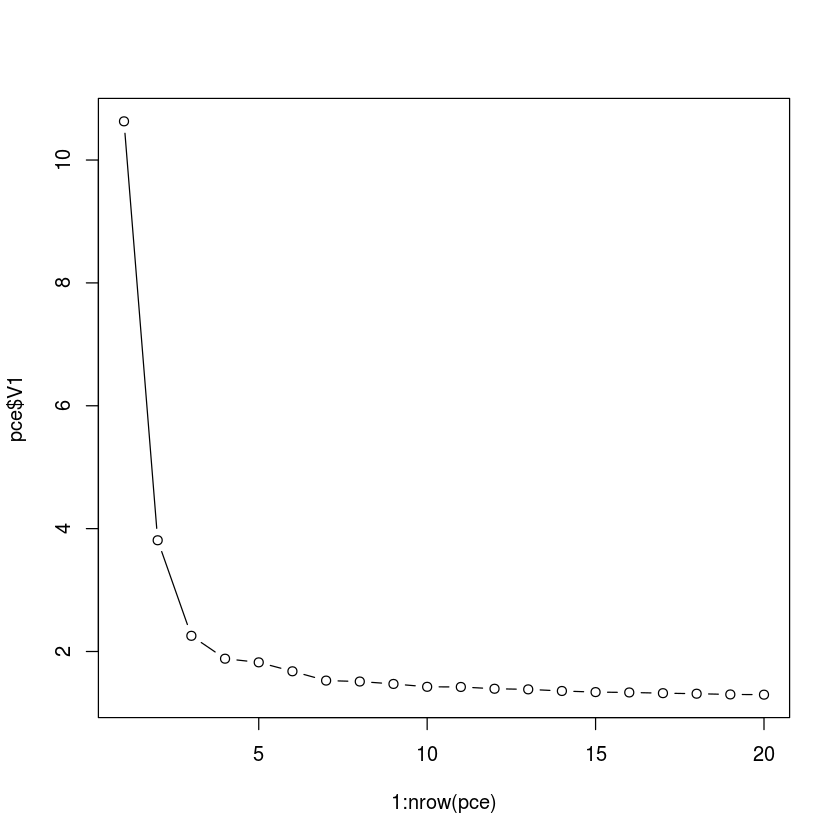

In [70]:
plot(x=1:nrow(pce),pce$V1,type = 'b')

In [76]:
pcs<-read.table('PCs20_SNP7.eigenvec')

In [78]:
pcs

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22
1,1,0.00952677,-0.00939745,0.018012900,-7.19347e-03,-0.004924330,1.49182e-02,-0.000213375,0.03791690,⋯,-0.032220600,0.01491990,0.088212700,-0.05487210,-0.00674358,0.080213700,-0.020840900,-0.03204950,-1.53844e-03,-0.00763739
2,2,0.01169980,-0.01111930,0.007663120,1.58549e-03,0.005702880,2.09971e-02,0.012247700,0.06742870,⋯,0.026025100,0.00495472,-0.038411200,0.03540030,-0.03736450,-0.012890600,0.018281500,0.06531040,1.56482e-02,-0.05136920
3,3,-0.05165840,0.17538100,-0.008953180,-1.05249e-01,-0.162210000,1.51923e-02,0.080276900,-0.00356575,⋯,0.008241300,-0.01555070,0.003733250,0.02168760,0.03421320,-0.005715640,-0.013173000,-0.00506197,5.63118e-03,-0.00887859
4,4,0.01194310,-0.01450770,0.030366600,-9.60677e-03,-0.001086250,1.63729e-02,-0.013674100,-0.00605865,⋯,-0.028815200,0.01157110,0.007598630,0.04747630,0.01734120,0.000956187,-0.055929900,-0.01139560,-1.45418e-02,0.05017210
5,5,0.00156812,-0.00726911,-0.040122300,1.42212e-03,0.017552800,-8.92432e-02,0.006020100,0.02341170,⋯,0.018151100,0.01340020,0.051583400,0.02137740,-0.02014030,0.003410910,0.024208200,-0.01560760,-1.32750e-05,-0.05678940
6,6,0.01271470,-0.01291500,0.010608700,-5.79240e-03,0.004924110,6.14119e-03,0.008395520,0.01818190,⋯,0.018573900,-0.00628985,0.019181600,0.05506520,-0.01221010,0.033747800,-0.005227870,-0.01056350,-2.57292e-02,0.02296670
7,7,0.01385940,-0.00861765,0.005123460,-6.34503e-06,0.005305130,1.54729e-02,-0.004948430,-0.00245231,⋯,0.004465680,0.02324430,0.014909000,0.01709660,0.00885461,0.031482600,0.072208500,-0.04268660,5.11734e-02,0.05032940
8,8,0.00963759,-0.00610993,0.022211100,-9.57540e-03,-0.003844220,3.04599e-02,0.022004500,0.06077680,⋯,-0.047702600,0.00690538,-0.038065600,0.02830230,-0.04070730,0.035121300,0.014967600,-0.02430950,-4.83895e-02,-0.01797970
9,9,-0.23065500,-0.08075480,0.005499790,-1.23033e-02,0.005374530,-9.34349e-05,-0.014758300,-0.00502821,⋯,0.022718000,0.01459170,0.020310700,-0.00404378,-0.03774910,0.004350710,-0.034355300,-0.00557615,9.16304e-03,0.02612890
10,10,-0.00550416,0.01335330,-0.129183000,1.60618e-02,0.025128100,5.98290e-03,-0.027885600,0.03634770,⋯,-0.045392800,0.05944810,0.005925450,-0.00806285,0.03769350,-0.048431400,-0.010803800,0.00231151,7.33837e-03,0.01023150


In [75]:
pcs$Sex<- Sexcheck$S

ERROR: Error in `$<-.data.frame`(`*tmp*`, Sex, value = c(1L, 2L, 1L, 1L, 1L, : replacement has 921 rows, data has 898


In [79]:
library(plotly)


p <- plot_ly(pcs, x = ~V3, y = ~V4, z = ~V5) %>%
  add_markers() %>%
  layout(scene = list(xaxis = list(title = 'Weight'),
                     yaxis = list(title = 'Gross horsepower'),
                     zaxis = list(title = '1/4 mile time')))
p

HTML widgets cannot be represented in plain text (need html)

In [82]:
pcs<-pcs[,-c(1,2)]

In [ ]:
(cl <- kmeans(pcs, 4))

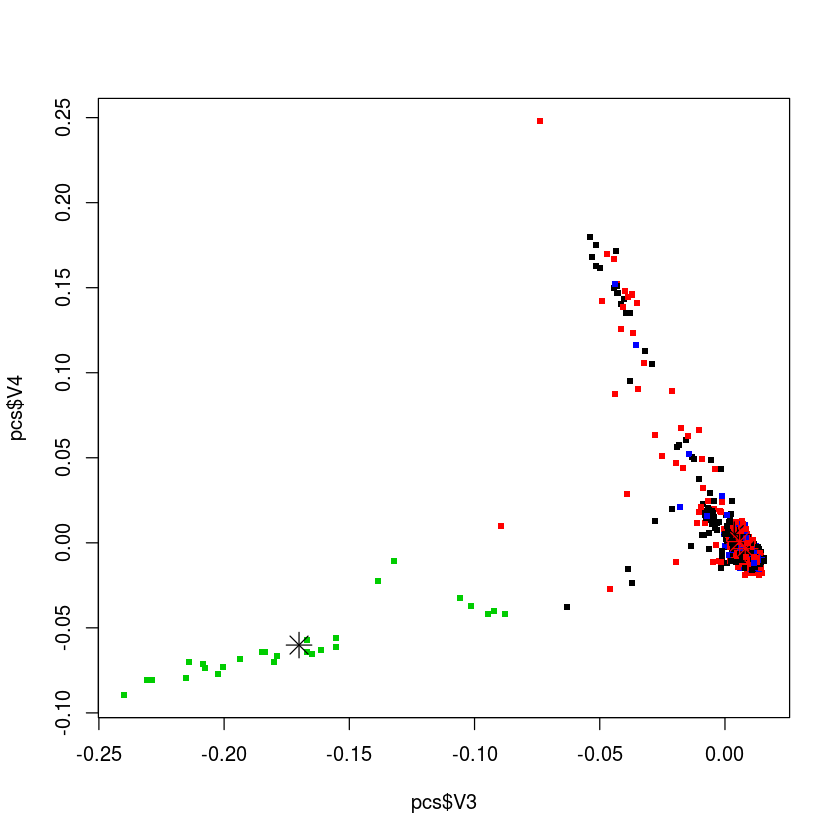

In [98]:
plot(pcs$V3,pcs$V4, col = cl$cluster,type =  'p',pch = '.',cex=5)
points(cl$centers, col = 1:2, pch = 8, cex = 2)